<center><h1>Schmidt_Matteus_HW8</h1></center>
<br>
<center><font size="4"> 

**Name:** Matteus Schmidt

**GitHub:** MatteusSchmidt

**USCID:** 3780947272

</font></center>

---

## 1. Supervised, Semi-Supervised, and Unsupervised Learning

Import packages

In [75]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import sklearn as sci
import statsmodels.api as sm
import scipy

from sklearn.cluster import KMeans
from sklearn.cluster import SpectralClustering
from sklearn.model_selection import train_test_split
from sklearn.pipeline import Pipeline
from sklearn.multiclass import OneVsRestClassifier
from sklearn.svm import LinearSVC, SVC

In [ ]:
# Note: Jupyter env on Python 3.12

# %pip install -r ../requirements.txt

### (a) Download the Breast Cancer Wisconsin (Diagnostic) Data Set

In [28]:
data = pd.read_csv('../data/wdbc.data', header=None)

In [ ]:
## drop ID
data = data.drop(columns=[0])
data = data.rename(columns={1:'Class'})

names = {}
for i in range(2,32):
    names[i] = str(f'var_{i-1}')

data = data.rename(columns=names)
data['class'] = data['Class'].map({'M': 1, 'B': 0}).astype(int) # bin ind for class (M == 1 (pos))
data = data.drop(columns=['Class'])

print(data.head())

   var_1  var_2   var_3   var_4    var_5    var_6   var_7    var_8   var_9  \
0  17.99  10.38  122.80  1001.0  0.11840  0.27760  0.3001  0.14710  0.2419   
1  20.57  17.77  132.90  1326.0  0.08474  0.07864  0.0869  0.07017  0.1812   
2  19.69  21.25  130.00  1203.0  0.10960  0.15990  0.1974  0.12790  0.2069   
3  11.42  20.38   77.58   386.1  0.14250  0.28390  0.2414  0.10520  0.2597   
4  20.29  14.34  135.10  1297.0  0.10030  0.13280  0.1980  0.10430  0.1809   

    var_10  ...  var_22  var_23  var_24  var_25  var_26  var_27  var_28  \
0  0.07871  ...   17.33  184.60  2019.0  0.1622  0.6656  0.7119  0.2654   
1  0.05667  ...   23.41  158.80  1956.0  0.1238  0.1866  0.2416  0.1860   
2  0.05999  ...   25.53  152.50  1709.0  0.1444  0.4245  0.4504  0.2430   
3  0.09744  ...   26.50   98.87   567.7  0.2098  0.8663  0.6869  0.2575   
4  0.05883  ...   16.67  152.20  1575.0  0.1374  0.2050  0.4000  0.1625   

   var_29   var_30  class  
0  0.4601  0.11890      1  
1  0.2750  0.08902      

### (b) Monte-Carlo Simulation

#### (i) Supervised Learning

/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/sklearn/svm/_base.py:1235: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/sklearn/svm/_base.py:1235: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/sklearn/svm/_base.py:1235: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/sklearn/svm/_base.py:1235: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/sklearn/svm/_base.py:1235: ConvergenceWarning: Liblinear failed to converge, increas

Confusion matrix for sample linear svm (TRAIN):
 [[284   1]
 [  3 167]] 



/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/sklearn/svm/_base.py:1235: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/sklearn/svm/_base.py:1235: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


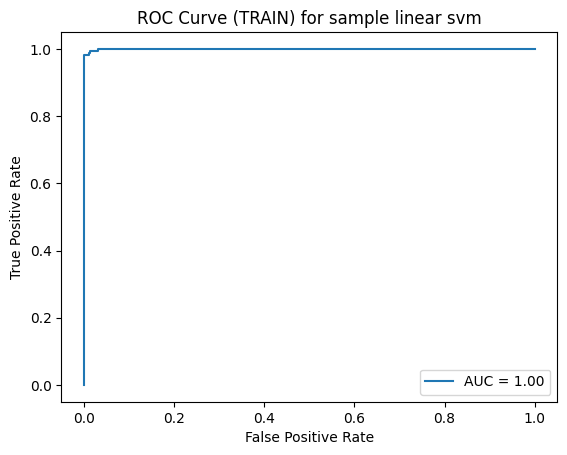

-----------------------------
Confusion matrix for sample linear svm (TEST):
 [[70  2]
 [ 3 39]] 



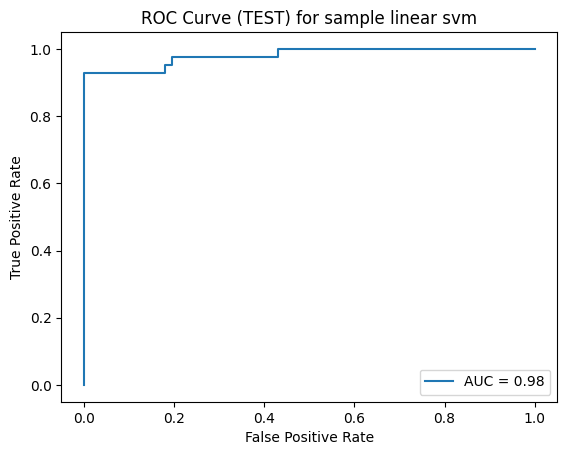

/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/sklearn/svm/_base.py:1235: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/sklearn/svm/_base.py:1235: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/sklearn/svm/_base.py:1235: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/sklearn/svm/_base.py:1235: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/sklearn/svm/_base.py:1235: ConvergenceWarning: Liblinear failed to converge, increas

Averages (Train):
	AUC: 0.9976
	Accuracy: 0.9873
	Precision: 0.992
	Recall: 0.9737
	F1-Score: 0.9828

Averages (Test):
	AUC: 0.9928
	Accuracy: 0.9652
	Precision: 0.9667
	Recall: 0.9389
	F1-Score: 0.9521


/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/sklearn/svm/_base.py:1235: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/sklearn/svm/_base.py:1235: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/sklearn/svm/_base.py:1235: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


In [38]:
train_metrics = {'AUC':[],'Accuracy':[],'Precision':[],'Recall':[],'F1-Score':[]}
test_metrics = {'AUC':[],'Accuracy':[],'Precision':[],'Recall':[],'F1-Score':[]}

random_number = np.random.randint(1, 31)

for i in range(1, 31):
    x_train, x_test, y_train, y_test = train_test_split(data.drop(columns=['class']), data['class'], test_size=0.2, stratify=data['class'], random_state=i)
    
    param_grid = {
        'estimator__estimator__C': [.01, .1, 1, 10, 100]
    }

    pipeline = Pipeline([
        ('scaler', sci.preprocessing.StandardScaler()),
        ('estimator', OneVsRestClassifier(LinearSVC(penalty='l1', dual=False, max_iter=10000)))
    ])


    grid_search = sci.model_selection.GridSearchCV(
        pipeline,
        param_grid=param_grid,
        cv=sci.model_selection.StratifiedKFold(n_splits=5),
        scoring='accuracy',
        n_jobs=-1
    )

    grid_search.fit(x_train, y_train)
    model = grid_search.best_estimator_

    y_hat_train = model.predict(x_train)
    y_score_train = model.decision_function(x_train)
    fp_rate_train, tp_rate_train, thresholds_train = sci.metrics.roc_curve(y_train, y_score_train)
    auc_train = sci.metrics.roc_auc_score(y_train, y_score_train)
    accuracy_train = sci.metrics.accuracy_score(y_train, y_hat_train)
    precision_train = sci.metrics.precision_score(y_train, y_hat_train, average='binary')
    recall_train = sci.metrics.recall_score(y_train, y_hat_train, average='binary')
    f1_train = sci.metrics.f1_score(y_train, y_hat_train, average='binary')

    y_hat_test = model.predict(x_test)
    y_score_test = model.decision_function(x_test)
    fp_rate_test, tp_rate_test, thresholds_test = sci.metrics.roc_curve(y_test, y_score_test)
    auc_test = sci.metrics.roc_auc_score(y_test, y_score_test)
    accuracy_test = sci.metrics.accuracy_score(y_test, y_hat_test)
    precision_test = sci.metrics.precision_score(y_test, y_hat_test, average='binary')
    recall_test = sci.metrics.recall_score(y_test, y_hat_test, average='binary')
    f1_test = sci.metrics.f1_score(y_test, y_hat_test, average='binary')

    train_metrics['AUC'].append(auc_train)
    train_metrics['Accuracy'].append(accuracy_train)
    train_metrics['Precision'].append(precision_train)
    train_metrics['Recall'].append(recall_train)
    train_metrics['F1-Score'].append(f1_train)
    
    test_metrics['AUC'].append(auc_test)
    test_metrics['Accuracy'].append(accuracy_test)
    test_metrics['Precision'].append(precision_test)
    test_metrics['Recall'].append(recall_test)
    test_metrics['F1-Score'].append(f1_test)

    if i == random_number:
        cm_train = sci.metrics.confusion_matrix(y_train, y_hat_train)
        cm_test = sci.metrics.confusion_matrix(y_test, y_hat_test)

        print("Confusion matrix for sample linear svm (TRAIN):\n", cm_train, '\n')
        plt.plot(fp_rate_train, tp_rate_train, label=f"AUC = {auc_train:.2f}")
        plt.xlabel("False Positive Rate")
        plt.ylabel("True Positive Rate")
        plt.title("ROC Curve (TRAIN) for sample linear svm")
        plt.legend()
        plt.show()

        print('-----------------------------')

        print("Confusion matrix for sample linear svm (TEST):\n", cm_test, '\n')
        plt.plot(fp_rate_test, tp_rate_test, label=f"AUC = {auc_test:.2f}")
        plt.xlabel("False Positive Rate")
        plt.ylabel("True Positive Rate")
        plt.title(f"ROC Curve (TEST) for sample linear svm")
        plt.legend()
        plt.show()

print('Averages (Train):')
for k, v in train_metrics.items():
    print('\t' + k + ':', round(np.mean(v), 4))

print('\nAverages (Test):')
for k, v in test_metrics.items():
    print('\t' + k + ':', round(np.mean(v), 4))

#### (ii) Semi-Supervised Learning/ Self-training

##### (A) & (B)

/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/sklearn/svm/_base.py:1235: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/sklearn/svm/_base.py:1235: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/sklearn/svm/_base.py:1235: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/sklearn/svm/_base.py:1235: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/sklearn/svm/_base.py:1235: ConvergenceWarning: Liblinear failed to converge, increas

Confusion matrix for self-training SVM (TRAIN):
 [[283   2]
 [  8 162]] 



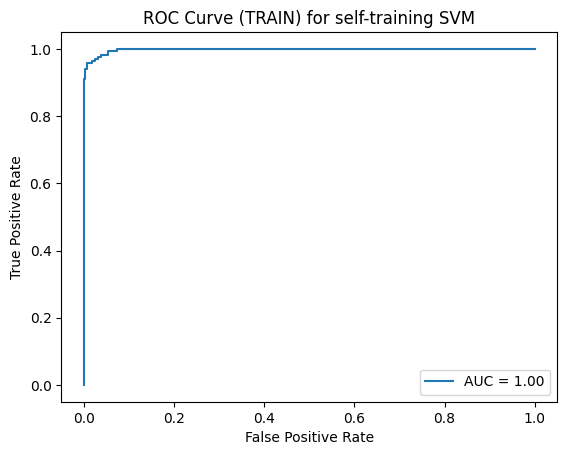

-----------------------------
Confusion matrix for self-training SVM (TEST):
 [[72  0]
 [ 4 38]] 



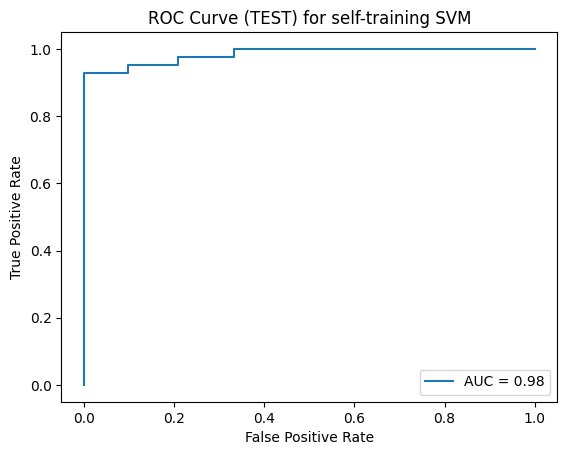

/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/sklearn/svm/_base.py:1235: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/sklearn/svm/_base.py:1235: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/sklearn/svm/_base.py:1235: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/sklearn/svm/_base.py:1235: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/sklearn/svm/_base.py:1235: ConvergenceWarning: Liblinear failed to converge, increas

Averages (Train):
	AUC: 0.9948
	Accuracy: 0.9763
	Precision: 0.9809
	Recall: 0.9555
	F1-Score: 0.9678

Averages (Test):
	AUC: 0.9914
	Accuracy: 0.9599
	Precision: 0.9701
	Recall: 0.9206
	F1-Score: 0.9441


In [39]:
train_metrics = {'AUC':[],'Accuracy':[],'Precision':[],'Recall':[],'F1-Score':[]}
test_metrics = {'AUC':[],'Accuracy':[],'Precision':[],'Recall':[],'F1-Score':[]}

random_number = np.random.randint(1, 31)

for i in range(1, 31):
    x_train, x_test, y_train, y_test = train_test_split(data.drop(columns=['class']), data['class'], test_size=0.2, stratify=data['class'], random_state=i)

    pos_idx = y_train[y_train==1].index
    neg_idx = y_train[y_train==0].index
    np.random.seed(i)
    labeled_pos = np.random.choice(pos_idx, size=len(pos_idx)//2, replace=False)
    labeled_neg = np.random.choice(neg_idx, size=len(neg_idx)//2, replace=False)
    labeled_idx   = np.concatenate([labeled_pos, labeled_neg])
    unlabeled_idx = y_train.index.difference(labeled_idx)

    x_lab = x_train.loc[labeled_idx];   y_lab = y_train.loc[labeled_idx]
    x_unl = x_train.loc[unlabeled_idx]; y_unl = y_train.loc[unlabeled_idx]

    param_grid = {
        'estimator__estimator__C': [.01, .1, 1, 10, 100]
    }

    pipeline = Pipeline([
        ('scaler', sci.preprocessing.StandardScaler()),
        ('estimator', OneVsRestClassifier(LinearSVC(penalty='l1', dual=False, max_iter=10000)))
    ])


    grid_search = sci.model_selection.GridSearchCV(
        pipeline,
        param_grid=param_grid,
        cv=sci.model_selection.StratifiedKFold(n_splits=5),
        scoring='accuracy',
        n_jobs=-1
    )

    grid_search.fit(x_lab, y_lab)
    model = grid_search.best_estimator_

    while len(x_unl) > 0:
        dists = np.abs(model.decision_function(x_unl))
        idex = x_unl.index[dists.argmax()]

        y_pseudo = model.predict( x_unl.loc[[idex]] )
        x_lab = pd.concat([x_lab, x_unl.loc[[idex]]])
        y_lab = pd.concat([y_lab, pd.Series(y_pseudo, index=[idex])])

        x_unl = x_unl.drop(idex)

        grid_search.fit(x_lab, y_lab)
        model = grid_search.best_estimator_

    y_hat_train = model.predict(x_train)
    y_score_train = model.decision_function(x_train)
    fp_rate_train, tp_rate_train, thresholds_train = sci.metrics.roc_curve(y_train, y_score_train)
    auc_train = sci.metrics.roc_auc_score(y_train, y_score_train)
    accuracy_train = sci.metrics.accuracy_score(y_train, y_hat_train)
    precision_train = sci.metrics.precision_score(y_train, y_hat_train, average='binary')
    recall_train = sci.metrics.recall_score(y_train, y_hat_train, average='binary')
    f1_train = sci.metrics.f1_score(y_train, y_hat_train, average='binary')

    y_hat_test = model.predict(x_test)
    y_score_test = model.decision_function(x_test)
    fp_rate_test, tp_rate_test, thresholds_test = sci.metrics.roc_curve(y_test, y_score_test)
    auc_test = sci.metrics.roc_auc_score(y_test, y_score_test)
    accuracy_test = sci.metrics.accuracy_score(y_test, y_hat_test)
    precision_test = sci.metrics.precision_score(y_test, y_hat_test, average='binary')
    recall_test = sci.metrics.recall_score(y_test, y_hat_test, average='binary')
    f1_test = sci.metrics.f1_score(y_test, y_hat_test, average='binary')

    train_metrics['AUC'].append(auc_train)
    train_metrics['Accuracy'].append(accuracy_train)
    train_metrics['Precision'].append(precision_train)
    train_metrics['Recall'].append(recall_train)
    train_metrics['F1-Score'].append(f1_train)
    
    test_metrics['AUC'].append(auc_test)
    test_metrics['Accuracy'].append(accuracy_test)
    test_metrics['Precision'].append(precision_test)
    test_metrics['Recall'].append(recall_test)
    test_metrics['F1-Score'].append(f1_test)

    if i == random_number:
        cm_train = sci.metrics.confusion_matrix(y_train, y_hat_train)
        cm_test = sci.metrics.confusion_matrix(y_test, y_hat_test)

        print("Confusion matrix for self-training SVM (TRAIN):\n", cm_train, '\n')
        plt.plot(fp_rate_train, tp_rate_train, label=f"AUC = {auc_train:.2f}")
        plt.xlabel("False Positive Rate")
        plt.ylabel("True Positive Rate")
        plt.title("ROC Curve (TRAIN) for self-training SVM")
        plt.legend()
        plt.show()

        print('-----------------------------')

        print("Confusion matrix for self-training SVM (TEST):\n", cm_test, '\n')
        plt.plot(fp_rate_test, tp_rate_test, label=f"AUC = {auc_test:.2f}")
        plt.xlabel("False Positive Rate")
        plt.ylabel("True Positive Rate")
        plt.title(f"ROC Curve (TEST) for self-training SVM")
        plt.legend()
        plt.show()

print('Averages (Train):')
for k, v in train_metrics.items():
    print('\t' + k + ':', round(np.mean(v), 4))

print('\nAverages (Test):')
for k, v in test_metrics.items():
    print('\t' + k + ':', round(np.mean(v), 4))

#### (iii) Unsupervised Learning

##### (A)

In [82]:
y = data['class']
scaler = sci.preprocessing.StandardScaler()
x_scaled = scaler.fit_transform(data.drop(columns=['class']))
data = pd.DataFrame(x_scaled, columns=data.drop(columns=['class']).columns, index=data.drop(columns=['class']).index)
data['class'] = y

In [83]:
for j in range(1,31):
    model = KMeans(n_clusters=2, n_init=15)
    model.fit(data.drop(columns=['class']))

For sklearn's KMeans model you can set n_init to values above 1. The K-Means algorithm then runs a total of n_init times with different random initializations. This allows the model to preserve its state in which optimizes the solution with the lowest total within-cluster variance. This helps avoid local minima.

##### (B)

In [84]:
def majority_labels(data, model):
    majority_dict = {}
    distances = model.transform(data.drop(columns=['Cluster', 'class']))

    for cluster_id in sorted(data['Cluster'].unique()):
        cluster_mask = data['Cluster'] == cluster_id
        cluster_indices = data[cluster_mask].index

        cluster_dists = distances[cluster_mask, cluster_id]
        closest_indices = cluster_dists.argsort()[:30]
        selected_idx = cluster_indices[closest_indices]

        top_labels = data.loc[selected_idx, 'class']
        most_common_label = top_labels.value_counts().idxmax()
        majority_dict[cluster_id] = most_common_label

    return majority_dict

In [ ]:
data = data.drop(columns=['Cluster', 'class_pred'])

Confusion matrix for KNN cluster (k=2):
 [[343  14]
 [ 37 175]] 



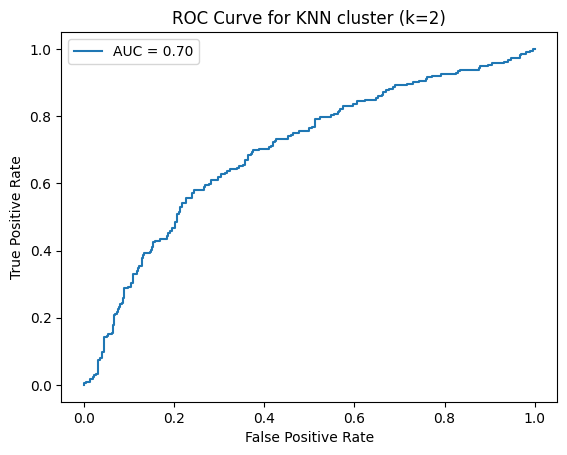

Averages (entire dataset):
	AUC: 0.6941
	Accuracy: 0.9088
	Precision: 0.9203
	Recall: 0.8269
	F1-Score: 0.8711


In [103]:
knn_metrics = {'AUC':[],'Accuracy':[],'Precision':[],'Recall':[],'F1-Score':[]}
random_number = np.random.randint(1, 31)

for j in range(1,31):
    model = KMeans(n_clusters=2, n_init=15)
    model.fit(data.drop(columns=['class']))

    # ----------------- #

    data['Cluster'] = model.labels_
    class_majority = majority_labels(data, model)
    data['class_pred'] = data['Cluster'].map(class_majority)

    distances = model.transform(data.drop(columns=['class', 'Cluster', 'class_pred']))
    assigned_clusters = model.labels_
    probs = scipy.special.softmax(distances, axis=1)
    scores = np.array([probs[i, cluster] for i, cluster in enumerate(assigned_clusters)])
    
    # ----------------- #

    true_labels = data['class']
    pred_labels = data['class_pred']

    # ----------------- #

    fpr, tpr, thresholds = sci.metrics.roc_curve(true_labels, scores)
    auc = sci.metrics.roc_auc_score(true_labels, scores)
    accuracy = sci.metrics.accuracy_score(true_labels, pred_labels)
    precision = sci.metrics.precision_score(true_labels, pred_labels, average='binary')
    recall = sci.metrics.recall_score(true_labels, pred_labels, average='binary')
    f1 = sci.metrics.f1_score(true_labels, pred_labels, average='binary')

    knn_metrics['AUC'].append(auc)
    knn_metrics['Accuracy'].append(accuracy)
    knn_metrics['Precision'].append(precision)
    knn_metrics['Recall'].append(recall)
    knn_metrics['F1-Score'].append(f1)

    if j == random_number:
        cm = sci.metrics.confusion_matrix(true_labels, pred_labels)

        print("Confusion matrix for KNN cluster (k=2):\n", cm, '\n')
        plt.plot(fpr, tpr, label=f"AUC = {auc:.2f}")
        plt.xlabel("False Positive Rate")
        plt.ylabel("True Positive Rate")
        plt.title("ROC Curve for KNN cluster (k=2)")
        plt.legend()
        plt.show()

    data = data.drop(columns=['Cluster', 'class_pred'])

print('Averages (entire dataset):')
for k, v in knn_metrics.items():
    print('\t' + k + ':', round(np.mean(v), 4))

##### (C)

Confusion matrix for KNN cluster (k=2):
 [[58  1]
 [13 42]] 



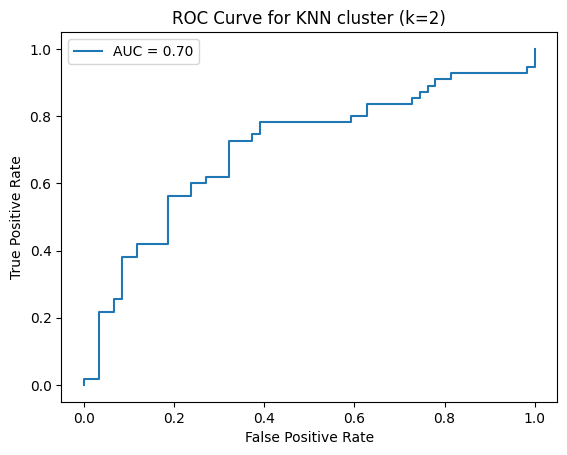

Averages (Test):
	AUC: 0.7032
	Accuracy: 0.8772
	Precision: 0.9767
	Recall: 0.7636
	F1-Score: 0.8571


In [104]:
knn_metrics = {'AUC': [], 'Accuracy': [], 'Precision': [], 'Recall': [], 'F1-Score': []}
train_data, test_data = train_test_split(data, test_size=0.2)
random_number = np.random.randint(1, 31)

for j in range(1, 31):
    model = KMeans(n_clusters=2, n_init=15)
    model.fit(train_data.drop(columns=['class']))

    data['Cluster'] = model.predict(data.drop(columns=['class']))
    class_majority = majority_labels(data, model)
    data['class_pred'] = data['Cluster'].map(class_majority)
    
    distances = model.transform(data.drop(columns=['class', 'Cluster', 'class_pred']))
    probs = scipy.special.softmax(distances, axis=1)
    assigned_clusters = data['Cluster'].values
    scores = np.array([probs[i, cluster] for i, cluster in enumerate(assigned_clusters)])

    # ----------------- #

    true_labels = test_data['class']
    pred_labels = data.loc[test_data.index, 'class_pred']
    scores_test = scores[test_data.index]

    # ----------------- #

    fpr, tpr, thresholds = sci.metrics.roc_curve(true_labels, scores_test)
    auc = sci.metrics.roc_auc_score(true_labels, scores_test)
    accuracy = sci.metrics.accuracy_score(true_labels, pred_labels)
    precision = sci.metrics.precision_score(true_labels, pred_labels, average='binary')
    recall = sci.metrics.recall_score(true_labels, pred_labels, average='binary')
    f1 = sci.metrics.f1_score(true_labels, pred_labels, average='binary')

    knn_metrics['AUC'].append(auc)
    knn_metrics['Accuracy'].append(accuracy)
    knn_metrics['Precision'].append(precision)
    knn_metrics['Recall'].append(recall)
    knn_metrics['F1-Score'].append(f1)

    if j == random_number:
        cm = sci.metrics.confusion_matrix(true_labels, pred_labels)
        print("Confusion matrix for KNN cluster (k=2):\n", cm, '\n')
        plt.plot(fpr, tpr, label=f"AUC = {auc:.2f}")
        plt.xlabel("False Positive Rate")
        plt.ylabel("True Positive Rate")
        plt.title("ROC Curve for KNN cluster (k=2)")
        plt.legend()
        plt.show()

    data = data.drop(columns=['Cluster', 'class_pred'])

print('Averages (Test):')
for k, v in knn_metrics.items():
    print(f'\t{k}: {round(np.mean(v), 4)}')


#### (iv) Spectral Clustering

In [73]:
def full_majority_labels(data):
    majority_dict = {}
    for cluster_id in sorted(data['Cluster'].unique()):
        cluster_data = data[data['Cluster'] == cluster_id]
        most_common_label = cluster_data['class'].value_counts().idxmax()
        majority_dict[cluster_id] = most_common_label
    return majority_dict

Confusion matrix for spectral cluster (clusters=2):
 [[351   6]
 [ 57 155]] 



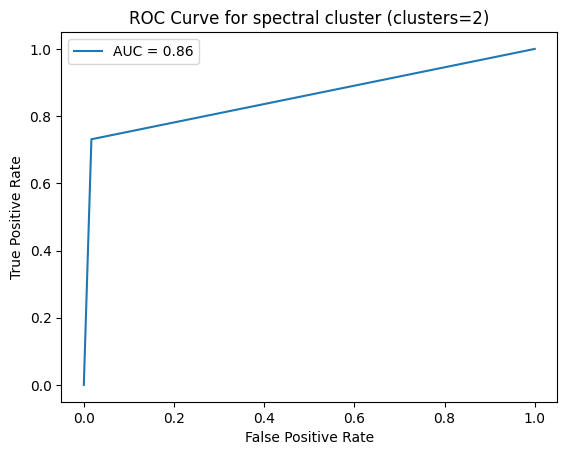

Averages (full dataset):
	AUC: 0.857
	Accuracy: 0.8892
	Precision: 0.9627
	Recall: 0.7308
	F1-Score: 0.8309


In [105]:
spectral_metrics = {'AUC':[],'Accuracy':[],'Precision':[],'Recall':[],'F1-Score':[]}
random_number = np.random.randint(1, 31)

for j in range(1,31):
    model = SpectralClustering(n_clusters=2, n_init=7, gamma=0.008)
    model.fit(data.drop(columns=['class']))

    # ----------------- #

    data['Cluster'] = model.labels_
    class_majority = full_majority_labels(data)
    data['class_pred'] = data['Cluster'].map(class_majority)

    assigned_clusters = model.labels_

    cluster_purity = {}
    for cluster_id in np.unique(model.labels_):
        cluster_indices = data[data['Cluster'] == cluster_id].index
        cluster_labels = data.loc[cluster_indices, 'class']
        majority_class = cluster_labels.mode()[0]
        purity = (cluster_labels == majority_class).mean()
        cluster_purity[cluster_id] = purity

    scores = data['Cluster'].map(cluster_purity).values
    
    # ----------------- #

    true_labels = data['class']
    pred_labels = data['class_pred']

    # ----------------- #

    fpr, tpr, thresholds = sci.metrics.roc_curve(true_labels, scores)
    auc = sci.metrics.roc_auc_score(true_labels, scores)
    accuracy = sci.metrics.accuracy_score(true_labels, pred_labels)
    precision = sci.metrics.precision_score(true_labels, pred_labels, average='binary')
    recall = sci.metrics.recall_score(true_labels, pred_labels, average='binary')
    f1 = sci.metrics.f1_score(true_labels, pred_labels, average='binary')

    spectral_metrics['AUC'].append(auc)
    spectral_metrics['Accuracy'].append(accuracy)
    spectral_metrics['Precision'].append(precision)
    spectral_metrics['Recall'].append(recall)
    spectral_metrics['F1-Score'].append(f1)

    if j == random_number:
        cm = sci.metrics.confusion_matrix(true_labels, pred_labels)

        print("Confusion matrix for spectral cluster (clusters=2):\n", cm, '\n')
        plt.plot(fpr, tpr, label=f"AUC = {auc:.2f}")
        plt.xlabel("False Positive Rate")
        plt.ylabel("True Positive Rate")
        plt.title("ROC Curve for spectral cluster (clusters=2)")
        plt.legend()
        plt.show()

    data = data.drop(columns=['Cluster', 'class_pred'])

print('Averages (full dataset):')
for k, v in spectral_metrics.items():
    print('\t' + k + ':', round(np.mean(v), 4))

Confusion matrix for spectral cluster (k=2):
 [[75  0]
 [14 25]] 



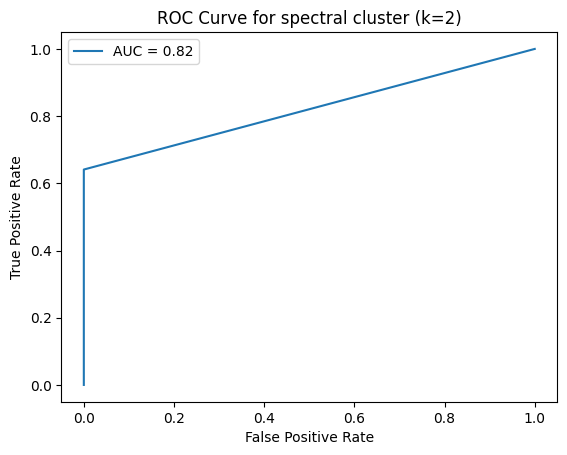

Averages (Test):
	AUC: 0.8205
	Accuracy: 0.8772
	Precision: 1.0
	Recall: 0.641
	F1-Score: 0.7812


In [106]:
spectral_metrics = {'AUC': [], 'Accuracy': [], 'Precision': [], 'Recall': [], 'F1-Score': []}
train_data, test_data = train_test_split(data, test_size=0.2)
random_number = np.random.randint(1, 31)

for j in range(1, 31):
    model = SpectralClustering(n_clusters=2, n_init=7, gamma=0.01)
    model.fit(data.drop(columns=['class']))

    data['Cluster'] = model.labels_
    class_majority = full_majority_labels(data)
    data['class_pred'] = data['Cluster'].map(class_majority)
    
    assigned_clusters = model.labels_

    cluster_purity = {}
    for cluster_id in np.unique(model.labels_):
        cluster_indices = data[data['Cluster'] == cluster_id].index
        cluster_labels = data.loc[cluster_indices, 'class']
        majority_class = cluster_labels.mode()[0]
        purity = (cluster_labels == majority_class).mean()
        cluster_purity[cluster_id] = purity

    scores = data['Cluster'].map(cluster_purity).values

    # ----------------- #

    true_labels = test_data['class']
    pred_labels = data.loc[test_data.index, 'class_pred']
    scores_test = scores[test_data.index]

    # ----------------- #

    fpr, tpr, thresholds = sci.metrics.roc_curve(true_labels, scores_test)
    auc = sci.metrics.roc_auc_score(true_labels, scores_test)
    accuracy = sci.metrics.accuracy_score(true_labels, pred_labels)
    precision = sci.metrics.precision_score(true_labels, pred_labels, average='binary')
    recall = sci.metrics.recall_score(true_labels, pred_labels, average='binary')
    f1 = sci.metrics.f1_score(true_labels, pred_labels, average='binary')

    spectral_metrics['AUC'].append(auc)
    spectral_metrics['Accuracy'].append(accuracy)
    spectral_metrics['Precision'].append(precision)
    spectral_metrics['Recall'].append(recall)
    spectral_metrics['F1-Score'].append(f1)

    if j == random_number:
        cm = sci.metrics.confusion_matrix(true_labels, pred_labels)
        print("Confusion matrix for spectral cluster (k=2):\n", cm, '\n')
        plt.plot(fpr, tpr, label=f"AUC = {auc:.2f}")
        plt.xlabel("False Positive Rate")
        plt.ylabel("True Positive Rate")
        plt.title("ROC Curve for spectral cluster (k=2)")
        plt.legend()
        plt.show()

    data = data.drop(columns=['Cluster', 'class_pred'])

print('Averages (Test):')
for k, v in spectral_metrics.items():
    print(f'\t{k}: {round(np.mean(v), 4)}')


#### (iv) Compare

As expected, the fully supervised model outperformed both the semi-supervised and unsupervised approaches, showing the highest overall accuracy, F1-score, and recall. The semi-supervised model still performed well, especially in recall, but had a lower F1. 

The unsupervised model underperformed on all metrics. This shows that while clustering can capture some structure, it struggles to align clusters with true labels without guidance. This is more likely due to the fact that the data space is not inherently clustered, and has a decision boundary thats easier learned by supervised methods.

## 2. Active Learning Using Support Vector Machines

### (a) Download the banknote authentication Data Set

In [114]:
data = pd.read_csv('../data/data_banknote_authentication.txt', header=None)
data = data.rename(columns={0:'var_1' ,1:'var_2', 2:'var_3', 3:'var_4', 4:'class'})
length = len(data)
print(data.head())
print('postive observations:', data[data['class'] == 1].shape[0])

     var_1   var_2   var_3    var_4  class
0  3.62160  8.6661 -2.8073 -0.44699      0
1  4.54590  8.1674 -2.4586 -1.46210      0
2  3.86600 -2.6383  1.9242  0.10645      0
3  3.45660  9.5228 -4.0112 -3.59440      0
4  0.32924 -4.4552  4.5718 -0.98880      0
postive observations: 610


In [116]:
pos = data[data['class'] == 1]
neg = data[data['class'] == 1]
pos_comp =  pos.shape[0] // data.shape[0]
n_pos_test = int(round(pos_comp * 472))
n_neg_test = 472 - n_pos_test

test_pos = pos.sample(n=n_pos_test, random_state=42)
test_neg = neg.sample(n=n_neg_test, random_state=42)

test = pd.concat([test_pos, test_neg]).sample(frac=1, random_state=42)
train = data.drop(index=test_data.index)

### (b) Repeat each of the following two procedures 50 times

#### (i) Passive

In [124]:
passive_error = []

for _ in range(1,51):
    test_errors = {}
    datapoints = pd.DataFrame()

    for rand in range(1,91):
        for i in range(1, 100000):
            curr_data = train[~train.index.isin(datapoints.index)].sample(n=10, random_state=i)
            df_combined = pd.concat([datapoints, curr_data], ignore_index=True)
            unique_counts = df_combined['class'].value_counts()
            if all(unique_counts >= 5):
                datapoints = df_combined
                break

        param_grid = {
            'estimator__C': [.01, .1, 1, 10, 100]
        }

        pipeline = Pipeline([
            ('scaler', sci.preprocessing.StandardScaler()),
            ('estimator', LinearSVC(penalty='l1', dual=False, max_iter=10000))
        ])


        grid_search = sci.model_selection.GridSearchCV(
            pipeline,
            param_grid=param_grid,
            cv=sci.model_selection.StratifiedKFold(n_splits=5),
            scoring='accuracy',
            n_jobs=-1
        )

        grid_search.fit(datapoints.drop(columns=['class']), datapoints['class'])
        model = grid_search.best_estimator_
        y_hat_test = model.predict(test.drop(columns=['class']))
        accuracy_train = sci.metrics.accuracy_score(test['class'], y_hat_test)
        test_errors[rand*10] = (1 - accuracy_train)
        
    passive_error.append(test_errors)
    

/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/sklearn/svm/_base.py:1235: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/sklearn/svm/_base.py:1235: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/sklearn/svm/_base.py:1235: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/sklearn/svm/_base.py:1235: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/sklearn/svm/_base.py:1235: ConvergenceWarning: Liblinear failed to converge, increas

#### (ii) Active

In [132]:
active_error = []

for _ in range(1, 51):
    test_errors = {}
    datapoints = pd.DataFrame()
    prev_model = None

    for rand in range(1, 91):
        if datapoints.empty:
            for i in range(1, 100000):
                curr_data = train.sample(n=10, random_state=i)
                df_combined = pd.concat([datapoints, curr_data], ignore_index=True)
                unique_counts = df_combined['class'].value_counts()
                
                if all(unique_counts >= 5):
                    datapoints = df_combined
                    break

        else:
            distances = np.abs(prev_model.decision_function(train[~train.index.isin(datapoints.index)].drop(columns='class')))
            closest = distances.argsort()[:10]
            curr_data = train[~train.index.isin(datapoints.index)].iloc[closest]
            datapoints = pd.concat([datapoints, curr_data], ignore_index=True)

        param_grid = {
            'estimator__C': [.01, .1, 1, 10, 100]
        }

        pipeline = Pipeline([
            ('scaler', sci.preprocessing.StandardScaler()),
            ('estimator', LinearSVC(penalty='l1', dual=False, max_iter=10000))
        ])

        grid_search = sci.model_selection.GridSearchCV(
            pipeline,
            param_grid=param_grid,
            cv=sci.model_selection.StratifiedKFold(n_splits=5),
            scoring='accuracy',
            n_jobs=-1
        )

        grid_search.fit(datapoints.drop(columns=['class']), datapoints['class'])
        prev_model = grid_search.best_estimator_

        y_hat_test = prev_model.predict(test.drop(columns=['class']))
        accuracy_train = sci.metrics.accuracy_score(test['class'], y_hat_test)
        test_errors[rand * 10] = (1 - accuracy_train)

    active_error.append(test_errors)


/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/sklearn/svm/_base.py:1235: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/sklearn/svm/_base.py:1235: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/sklearn/svm/_base.py:1235: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/sklearn/svm/_base.py:1235: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/sklearn/svm/_base.py:1235: ConvergenceWarning: Liblinear failed to converge, increas

### (c) Average the 50 test errors

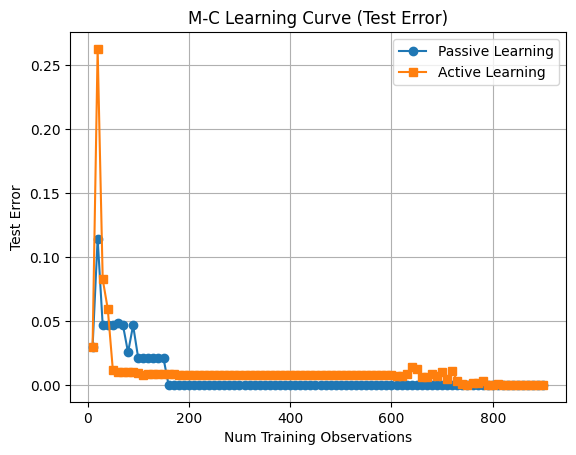

In [134]:
active_df = pd.DataFrame(active_error)
passive_df = pd.DataFrame(passive_error)
active_avg = active_df.mean().to_dict()
passive_avg = passive_df.mean().to_dict()

plt.plot(passive_avg.keys(), [passive_avg[k] for k in passive_avg.keys()], marker='o', label='Passive Learning')
plt.plot(active_avg.keys(), [active_avg[k] for k in active_avg.keys()], marker='s', label='Active Learning')

plt.xlabel("Num Training Observations")
plt.ylabel("Test Error")
plt.title("M-C Learning Curve (Test Error)")
plt.legend()
plt.grid(True)

The plot shows that active learning consistently outperforms passive learning early on, especially below ~170 observations. While active learning is more erratic at the start, it eventually converges to similar performance as passive learning. This suggests that actively sampling points near the margin may not help much in this setup and could even hurt in low-data regimes. In the end, both methods reach near-zero error with enough labeled data.Passive learning is preferred as it is of lower computational cost, as well as being more effective at a variety of observations.

The superior method (passive learning) leads me to believe that the feature space doesn't have a complex or noisy boundary, making active refinement near the hyperplane less helpful than broad samples. It's a mickey-mouse problem essentially.

## References

**AUC / ROC on KNN clustering:** https://stackoverflow.com/questions/9804724/roc-curve-from-the-result-of-a-classification-or-clustering

**spectral clustering:** https://scikit-learn.org/stable/modules/generated/sklearn.cluster.SpectralClustering.html